# Appliances Energy Prediction : A Machine Learning Approach


##### Name : Sanusha Santhosh V

##### Organization : Entri Elevate

##### Date : 25th Sept 2024



### Overview 

The Appliances Energy Prediction project is designed to track energy consumption patterns in a residential setting, focusing on the usage of appliances and lighting.

It explores how factors like indoor temperatures, humidity, and outdoor weather variables influence energy use.

The notebook follows a typical machine learning pipeline, including data collection, preprocessing, exploratory data analysis (EDA), model selection, training, and evaluation.

The final model will be evaluated based on performance metrics such as MSE, RMSE, MAE, and R² to ensure high accuracy and reliability.

### Objective 
The goal is to predict energy consumption and explore the relationship between environmental variables and energy usage to optimize energy efficiency.

The project also aims to contribute to sustainable energy use by reducing unnecessary consumption.

### Data Description 
Source : https://data.world/uci/appliances-energy-prediction



The dataset contains 19,735 rows and 29 columns.

#### • date
The timestamp of the recorded observation.
#### • Appliances (Wh)
The energy consumption of various household appliances, measured in watt-hours.
#### • lights (Wh)
The energy consumption of lights, measured in watt-hours.
#### • Indoor Environmental Variables:
##### Temperature Variables (°C):

T1: Temperature in the kitchen.

T2: Temperature in the living room.

T3: Temperature in the laundry room.

T4: Temperature in the office.

T5: Temperature in the bathroom.

T6: Temperature outside the building (North side).

T7: Temperature in the ironing room.

T8: Temperature in the teenager's room.

T9: Temperature in the parents' room.

##### Relative Humidity Variables (%):

RH_1: Relative humidity in the kitchen.

RH_2: Relative humidity in the living room.

RH_3: Relative humidity in the laundry room.

RH_4: Relative humidity in the office.

RH_5: Relative humidity in the bathroom.

RH_6: Relative humidity outside the building (North side).

RH_7: Relative humidity in the ironing room.

RH_8: Relative humidity in the teenager's room.

RH_9: Relative humidity in the parents' room.

#### • Outdoor Weather Variables:

##### T_out (°C):
Outdoor temperature.
##### Press_mm_hg:
Outdoor atmospheric pressure, measured in millimeters of mercury.
##### RH_out (%):
Outdoor relative humidity.
##### Windspeed (m/s):
The wind speed measured outside the building.
##### Visibility (km):
Outdoor visibility measured in kilometers.
##### Tdewpoint (°C):
Dew point temperature outside the building.
#### • Random Variables:

rv1 and rv2: Random variables that may serve as experimental variables or noise.



### Import Libraries

Importing necessory libraries from numpy, pandas and sklearn

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import RFE 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import xgboost as xgb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from math import sqrt
from sklearn.model_selection import GridSearchCV
import joblib
import warnings
warnings.filterwarnings('ignore')

### Load the Dataset

Loading the dataset downloaded from data.world

In [2]:
df = pd.read_csv("energydata_complete.csv")

### Data Inspection

Data exploration, cleaning and Transformation of data

In [3]:
df.head() # display first five rows of the dataset

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [4]:
df.tail() # display last five rows of the dataset

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.7,...,23.2,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,...,23.2,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.7,...,23.2,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,...,23.2,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784
19734,2016-05-27 18:00:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,...,23.2,46.8450,22.200000,755.2,57.000000,4.000000,27.000000,13.200000,34.118851,34.118851


In [5]:
df.info() # gives a basic info of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [6]:
df.describe().T # gives the statistical analysis of numerical columns

,count,mean,std,min,25%,50%,75%,max
Appliances,19735.0,97.694958,102.524891,10.000000,50.000000,60.000000,100.000000,1080.000000
lights,19735.0,3.801875,7.935988,0.000000,0.000000,0.000000,0.000000,70.000000
T1,19735.0,21.686571,1.606066,16.790000,20.760000,21.600000,22.600000,26.260000
RH_1,19735.0,40.259739,3.979299,27.023333,37.333333,39.656667,43.066667,63.360000
T2,19735.0,20.341219,2.192974,16.100000,18.790000,20.000000,21.500000,29.856667
RH_2,19735.0,40.420420,4.069813,20.463333,37.900000,40.500000,43.260000,56.026667
T3,19735.0,22.267611,2.006111,17.200000,20.790000,22.100000,23.290000,29.236000
RH_3,19735.0,39.242500,3.254576,28.766667,36.900000,38.530000,41.760000,50.163333
T4,19735.0,20.855335,2.042884,15.100000,19.530000,20.666667,22.100000,26.200000
RH_4,19735.0,39.026904,4.341321,27.660000,35.530000,38.400000,42.156667,51.090000


In [7]:
df.duplicated().sum() # to identify how much duplicates values are present 

0

In [8]:
df.isnull().sum() # to identify how much null values are present in each columns

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

### Feature Engineering

Feature engineering, a preprocessing step that involves creating new features or modifying existing features to improve model performance.

In [9]:
df.shape   # to find the shape of the dataset

(19735, 29)

In [10]:
df.columns    # to display the column names of the dataset

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [11]:
df=df.drop('date', axis=1)   # drop column 'date' as its not neccessary for model implementing

In [12]:
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [13]:
# Splitting the dataset into target variable and feature variable

x=df.drop('Appliances', axis=1)
y=df['Appliances']

Now, x contains the input features, and y contains the value we want to predict (the target).

### Feature Selection

Feature selection is the process of selecting relevant features to build a predictive model.

In [14]:
model = RandomForestRegressor()                            
rfe = RFE(estimator=model, n_features_to_select=10)
x_rfe = rfe.fit_transform(x, y)                            

# Get the selected features
selected_features = x.columns[rfe.support_]                                                         # to find which features supports most
print("Selected Features:", selected_features)

# Get the ranking of features
feature_ranking = rfe.ranking_                                                                      # to find the rankings of the features
print("Feature Ranking:", feature_ranking)

# Get the importance scores of features
model.fit(x, y)
feature_importances = model.feature_importances_                                                    # to find which features are important by score
importance_df = pd.DataFrame({'Feature': x.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print("Feature Importances:\n", importance_df)

Selected Features: Index(['RH_1', 'RH_2', 'T3', 'RH_3', 'RH_5', 'RH_7', 'T8', 'RH_8',
       'Press_mm_hg', 'RH_out'],
      dtype='object')
Feature Ranking: [ 8 11  1  3  1  1  1  6 10  7  1  2  5 15  1  1  1 12  4 16  1  1 14 17
  9 13 18]
Feature Importances:
         Feature  Importance
21       RH_out    0.064368
2          RH_1    0.057210
20  Press_mm_hg    0.052054
6          RH_3    0.049967
5            T3    0.047562
16         RH_8    0.047505
10         RH_5    0.047297
0        lights    0.046889
4          RH_2    0.044617
12         RH_6    0.040534
15           T8    0.040093
14         RH_7    0.038001
3            T2    0.034667
7            T4    0.034623
8          RH_4    0.034120
18         RH_9    0.033543
9            T5    0.033032
11           T6    0.030759
17           T9    0.030736
24    Tdewpoint    0.029951
1            T1    0.028177
22    Windspeed    0.028024
13           T7    0.026822
19        T_out    0.024393
23   Visibility    0.020159
25      

In [15]:
df=df.drop(['T5', 'T6', 'T1', 'RH_9', 'T9', 'Tdewpoint', 'Windspeed', 'T7', 'T_out', 'Visibility', 'rv2', 'rv1'], axis=1)

In [16]:
df.head()

,Appliances,lights,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,RH_5,RH_6,RH_7,T8,RH_8,Press_mm_hg,RH_out
0,60,30,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,55.20,84.256667,41.626667,18.2,48.900000,733.5,92.0
1,60,30,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,55.20,84.063333,41.560000,18.2,48.863333,733.6,92.0
2,50,30,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,55.09,83.156667,41.433333,18.2,48.730000,733.7,92.0
3,50,40,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,55.09,83.423333,41.290000,18.1,48.590000,733.8,92.0
4,60,40,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,55.09,84.893333,41.230000,18.1,48.590000,733.9,92.0


### Exploratory Data Analysis (EDA)

Exploratory Data Analysis (EDA) is a crucial step that helps you understand the main characteristics of your dataset, uncover patterns, and identify relationships between variables.

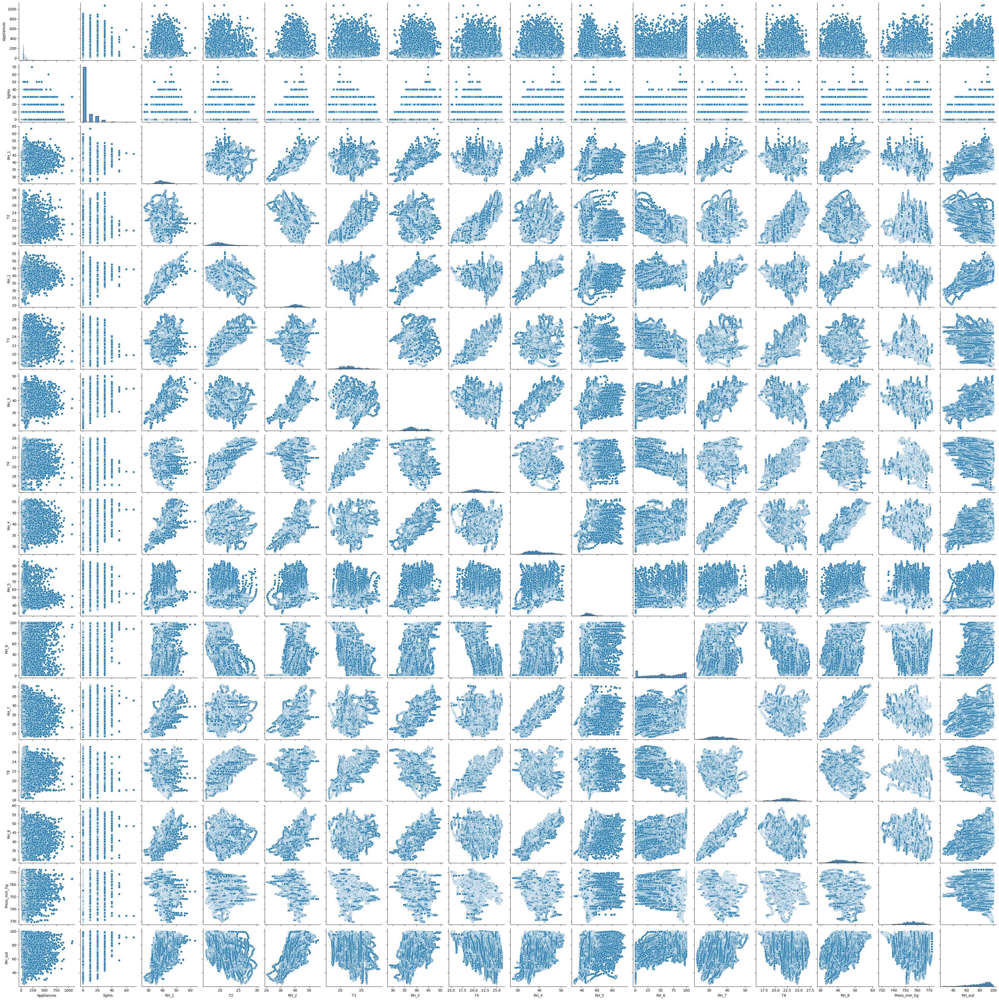

In [17]:
sns.pairplot(df)
plt.show()

This plot is useful for getting an initial visual feel for how the variables are related to one another and for detecting any outliers or trends.

Linear: You will see straight, consistent lines (either sloping up or down).

Non-linear: The points form a clear, but curved pattern.

No relationship: Points are spread all over the scatter plot with no discernible pattern.

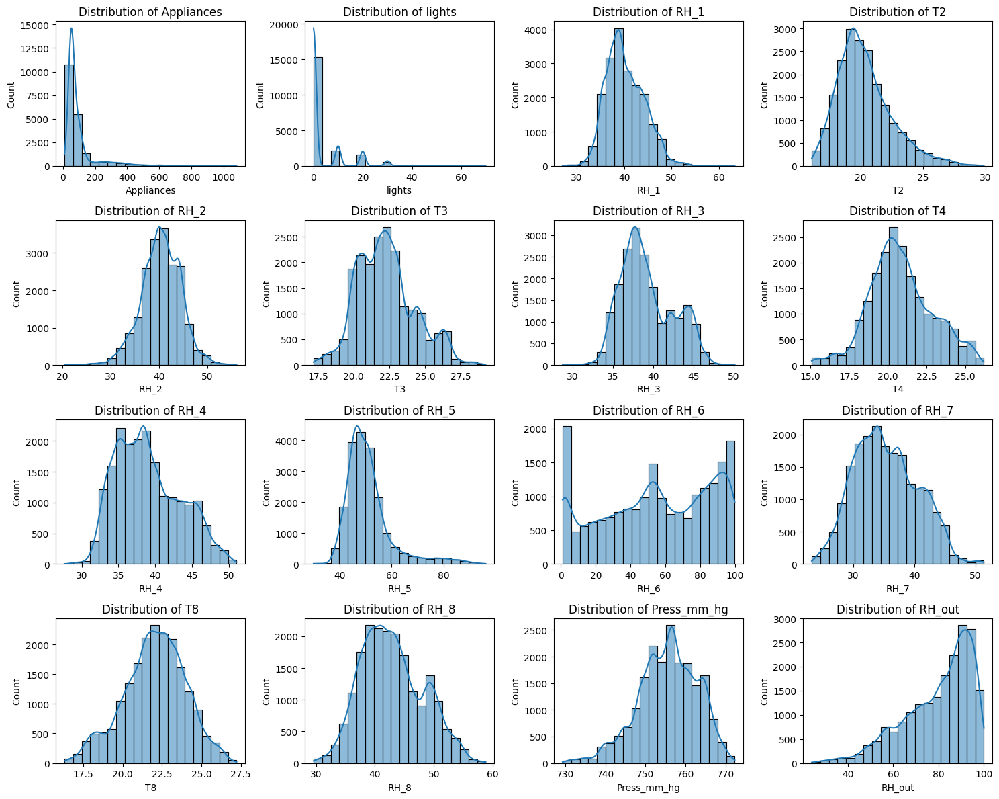

In [18]:
# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(15, 12))  # Adjust the figsize to fit the plots

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop through the columns of the dataframe and plot each one
for i, column in enumerate(df.columns):
    if i < 16:  # To ensure we don't exceed 16 subplots (4x4 grid)
        sns.histplot(df[column], bins=20, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {column}')

# Remove any empty subplots if there are less than 15 columns
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


This dataset appears to have relatively consistent environmental conditions (temperatures, humidity) but varying usage patterns in appliances and lighting, which may correlate with different external or operational factors.

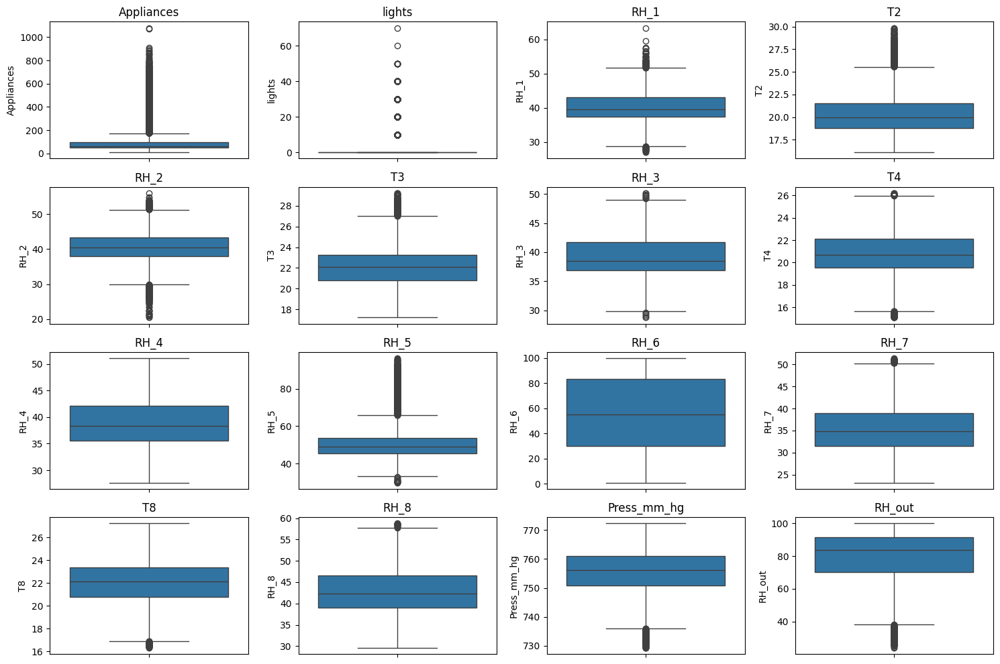

In [19]:
# Select numerical columns
numerical_cols = df.select_dtypes(include=['int64','float64'])

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 10))
axes = axes.flatten()

# Plot boxplots for each numerical column
for i, column in enumerate(numerical_cols):
    sns.boxplot(y=df[column], ax=axes[i])
    axes[i].set_title(column)

plt.tight_layout()
plt.show()

As we can see there are outliers in almost all columns, so using IQR method in next step, all outliers will be treated.

Appliances is kept as an exception as it is the target variable.

In [20]:
# Outlier treatment function
def treat_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Capping the outliers
    df[column_name] = df[column_name].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

    return df


In [21]:
columns_to_treat = ['RH_1', 'lights', 'T2', 'T3', 'RH_2',
                    'RH_3', 'T4', 'RH_5','RH_7', 'RH_8', 'T8', 'RH_out', 'Press_mm_hg']
for column in columns_to_treat:
    if column in df.columns:
        df = treat_outliers(df, column)

# Display the treated DataFrame
df.head()

,Appliances,lights,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,RH_5,RH_6,RH_7,T8,RH_8,Press_mm_hg,RH_out
0,60,0.0,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,55.20,84.256667,41.626667,18.2,48.900000,735.933333,92.0
1,60,0.0,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,55.20,84.063333,41.560000,18.2,48.863333,735.933333,92.0
2,50,0.0,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,55.09,83.156667,41.433333,18.2,48.730000,735.933333,92.0
3,50,0.0,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,55.09,83.423333,41.290000,18.1,48.590000,735.933333,92.0
4,60,0.0,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,55.09,84.893333,41.230000,18.1,48.590000,735.933333,92.0


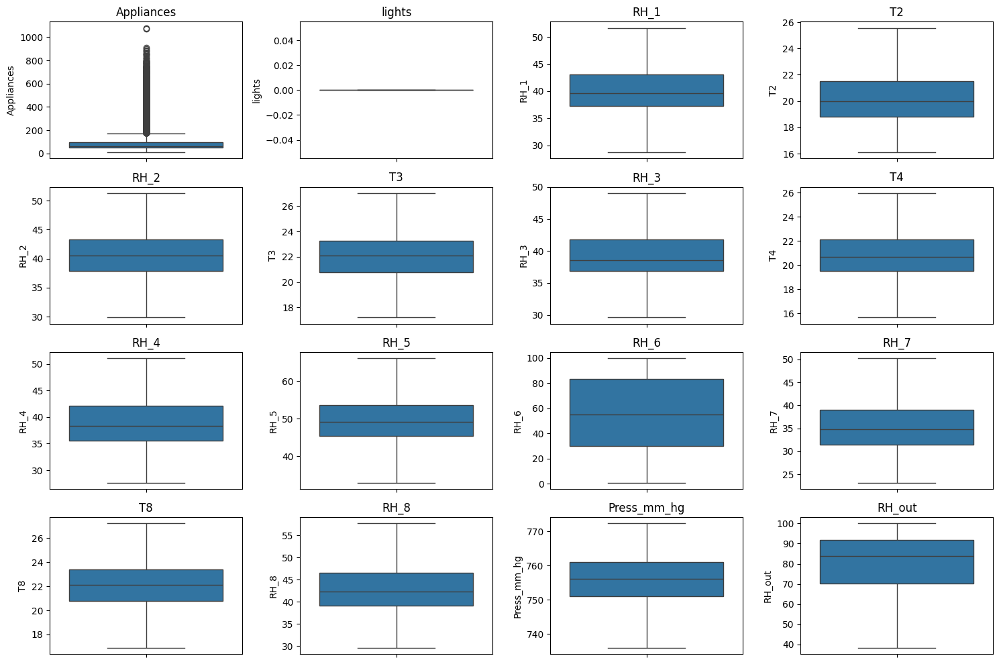

In [22]:

# Select numerical columns
numerical_cols = df.select_dtypes(include=['int64','float64'])

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 10))
axes = axes.flatten()

# Plot boxplots for each numerical column
for i, column in enumerate(numerical_cols):
    sns.boxplot(y=df[column], ax=axes[i])
    axes[i].set_title(column)

plt.tight_layout()
plt.show()

All outliers are treated.
'lights' column needs to be droped as it has no contributions to prediction.

In [23]:
df.drop('lights', axis=1, inplace=True)

In [24]:
# Select only numeric columns
numeric_data = df.select_dtypes(include=['int64', 'float64'])

# Calculate correlation matrix
correlation_matrix = numeric_data.corr()

correlation_matrix

,Appliances,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,RH_5,RH_6,RH_7,T8,RH_8,Press_mm_hg,RH_out
Appliances,1.000000,0.085197,0.119919,-0.062850,0.081226,0.036186,0.040568,0.016965,-0.016129,-0.083178,-0.055590,0.039693,-0.094012,-0.033907,-0.154724
RH_1,0.085197,1.000000,0.275929,0.799038,0.250162,0.847233,0.107189,0.884049,0.379221,0.246386,0.804512,-0.031118,0.739360,-0.296579,0.270223
T2,0.119919,0.275929,1.000000,-0.142967,0.737570,0.125669,0.766449,0.238357,0.017815,-0.581169,0.231256,0.585830,0.070666,-0.133796,-0.499661
RH_2,-0.062850,0.799038,-0.142967,1.000000,0.142631,0.680941,-0.042742,0.724656,0.326742,0.388887,0.695628,-0.038966,0.684612,-0.258126,0.576446
T3,0.081226,0.250162,0.737570,0.142631,1.000000,-0.012923,0.853877,0.119706,-0.077568,-0.648697,0.170536,0.798280,0.041769,-0.193485,-0.277986
RH_3,0.036186,0.847233,0.125669,0.680941,-0.012923,1.000000,-0.139983,0.899134,0.461180,0.514926,0.832867,-0.283155,0.828955,-0.234032,0.355779
T4,0.040568,0.107189,0.766449,-0.042742,0.853877,-0.139983,1.000000,-0.047629,-0.099938,-0.703680,0.044679,0.795546,-0.094410,-0.076822,-0.387281
RH_4,0.016965,0.884049,0.238357,0.724656,0.119706,0.899134,-0.047629,1.000000,0.431319,0.392178,0.894370,-0.166808,0.847270,-0.251692,0.335678
RH_5,-0.016129,0.379221,0.017815,0.326742,-0.077568,0.461180,-0.099938,0.431319,1.000000,0.325405,0.413997,-0.116093,0.452087,-0.148630,0.237737
RH_6,-0.083178,0.246386,-0.581169,0.388887,-0.648697,0.514926,-0.703680,0.392178,0.325405,1.000000,0.357134,-0.666068,0.489577,-0.061718,0.720759


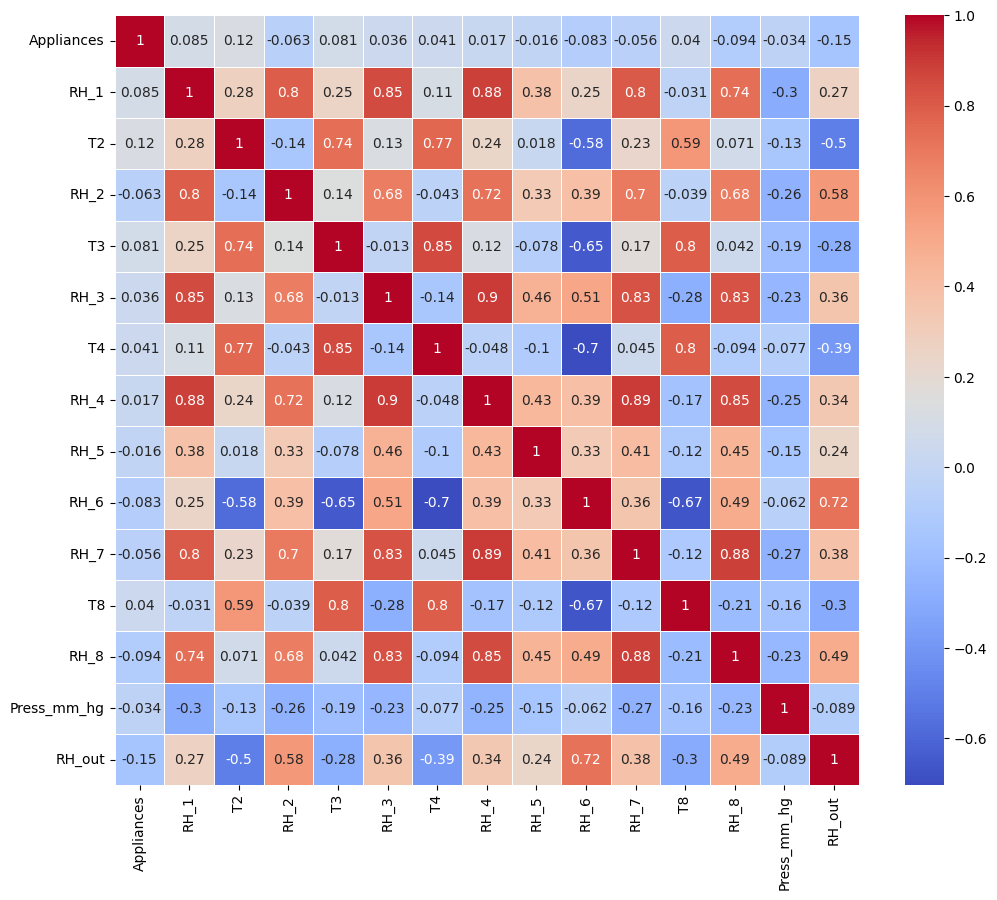

In [25]:
plt.figure(figsize=(12, 10)) 
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.show()

Positive Correlations:

Features like "T3" and "T4" have high positive correlations with each other, suggesting they may represent similar environmental conditions or variables.

Negative Correlations:

Variables such as "RH_out" (relative humidity outside) and "Press_mm_hg" (pressure) have strong negative correlations indicating inverse relationships.

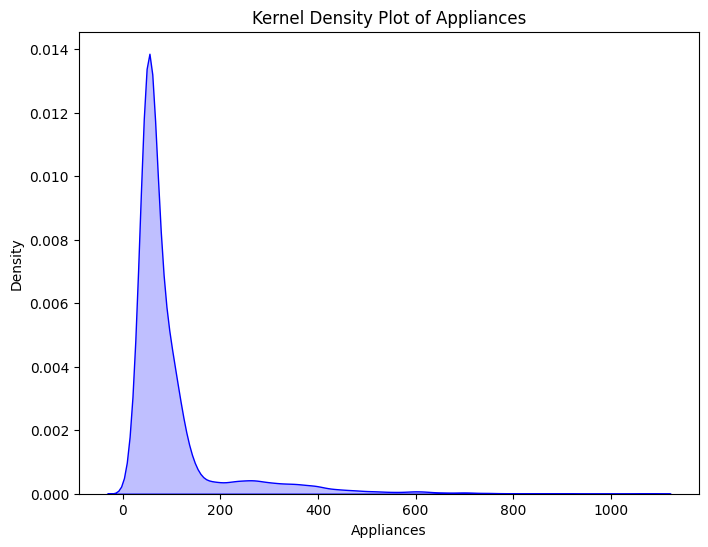

In [26]:
# KDE of Target Variable
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df, x='Appliances', fill=True, color='blue')  # KDE plot for 'T2' column
plt.title('Kernel Density Plot of Appliances')
plt.xlabel('Appliances')
plt.ylabel('Density')
plt.show()


The KDE plot reveals that appliance usage is typically low, with rare instances of higher energy consumption. 
This right-skewed distribution suggests that most of the time, appliances are used conservatively, with occasional high-demand periods.

In [27]:
# Splitting target variable and feature variable 
x=df.drop('Appliances', axis=1)
y=df['Appliances']

In [28]:
# Train test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

### Model Implementation

In [29]:
# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor(),
    'XGBoost Regressor': xgb.XGBRegressor()
}

### Model Evaluation

In [30]:
# Train and test models
results = {}
for model_name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # Store results
    results[model_name] = {
        'R2 Score': r2_score(y_test, y_pred),
        'MSE': mean_squared_error(y_test, y_pred),
        'RMSE': sqrt(mean_squared_error(y_test, y_pred)),
        'MAE': mean_absolute_error(y_test, y_pred)
    }

# Display the evaluation results
results_df = pd.DataFrame(results).T
results_df


,R2 Score,MSE,RMSE,MAE
Linear Regression,0.120434,8801.901239,93.818448,54.777783
Decision Tree Regressor,0.176004,8245.806942,90.806426,37.593109
Random Forest Regressor,0.578145,4221.546395,64.973428,30.384596
Gradient Boosting Regressor,0.241963,7585.740508,87.096157,48.200801
XGBoost Regressor,0.501448,4989.056520,70.633254,35.523443


### Hyperparameter Tuning

Hyperparameter is the process in machine learning to improve the accuracy and performance of the model.

In [31]:
# Define the parameter grid for RandomForestRegressor
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees
    'max_depth': [10, 20, 30],      # Maximum depth of trees
    'min_samples_split': [2, 5, 10],  # Minimum samples to split a node
    'min_samples_leaf': [1, 2, 4],    # Minimum samples at leaf node
    'bootstrap': [True, False]        # Whether bootstrap samples are used
}

# Initialize the RandomForestRegressor
rf = RandomForestRegressor(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='r2')

# Fit the model using GridSearchCV
grid_search.fit(x_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_rf_model = grid_search.best_estimator_

# Finding the best parameters
print("The Best parameters is : ", grid_search.best_params_)


Fitting 3 folds for each of 162 candidates, totalling 486 fits
The Best parameters is :  {'bootstrap': True, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


### Model Evaluation after Hyperparameter Tuning

In [32]:
# Train and test models
results_after = {}
for model_name, model in models.items():
    if model_name == 'Random Forest Regressor':
        model = best_rf_model
    else:
        model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    # Store results
    results_after[model_name] = {
        'R2 Score': r2_score(y_test, y_pred),
        'MSE': mean_squared_error(y_test, y_pred),
    }

In [33]:
# Display the evaluation results
results_after_df = pd.DataFrame(results_after).T
results_after_df

,R2 Score,MSE
Linear Regression,0.120434,8801.901239
Decision Tree Regressor,0.174416,8261.692425
Random Forest Regressor,0.589292,4109.992011
Gradient Boosting Regressor,0.241602,7589.355966
XGBoost Regressor,0.501448,4989.056520


### Identifying the Best Model for the Dataset

In [34]:
# Identify the best performing model
best_model_name = results_after_df['R2 Score'].idxmax()
print(f"The best performing model is: {best_model_name}")

The best performing model is: Random Forest Regressor


### Saving the Model

In [35]:
# saving the model 
joblib.dump(model, 'RFR.pkl')

['RFR.pkl']

### Loading the Saved Model

In [36]:
# loading the saved model
loaded_model = joblib.load('RFR.pkl')

### Test with unseen Data

In [37]:
# Created a DataFrame with the selected features from feature selection
unseen_data = pd.read_csv("unseendata.csv")

unseen_data.head()

,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,RH_5,RH_6,RH_7,T8,RH_8,Press_mm_hg,RH_out
0,43.490,19.000000,42.03,19.390000,43.290000,20.263580,42.326667,54.500000,96.156667,38.030,19.39,48.73,735.600000,94.000000
1,43.290,19.033333,42.09,19.365000,43.290000,20.266667,42.326667,54.133333,96.090000,38.045,19.39,48.59,735.666667,93.666667
2,43.145,19.033333,42.09,19.356667,43.400000,20.533333,42.326667,53.860000,96.090000,38.090,19.39,48.59,735.733333,93.333333
3,43.060,19.033333,42.09,19.290000,43.326667,20.326667,42.260000,53.526667,96.030000,38.090,19.39,48.59,735.800000,93.000000
4,43.000,19.100000,42.06,19.290000,43.260000,20.133333,42.245000,53.326667,96.000000,38.090,19.39,48.59,735.883333,92.666667


In [38]:
# Assuming 'unseen_data' is your new data for prediction
predictions = loaded_model.predict(unseen_data)

# Print predictions
print(predictions)


[368.68146 356.7209  333.14078 352.75793 289.21106 247.03117 284.587
 265.2467  309.1167  296.18958]


### Conclusion 

The project effectively demonstrates the end-to-end process of building a machine learning model for appliance energy consumption prediction.

Multiple models, including Linear Regression, Decision Trees, Random Forest, Gradient Boosting, and XGBoost, were implemented and thoroughly evaluated to ensure the best-performing model.

Hyperparameter tuning further improved the performance and Random Forest Regressor emerged as the most robust and accurate model, making it the optimal choice for predicting energy usage. 

The project’s comprehensive approach ensures that the model is both reliable and suitable for real-world applications in energy management and optimization.

### Future Work 

Feature Engineering: Add relevant external factors like weather and occupancy data, and apply advanced selection methods like PCA to optimize features.

Handling Data Imbalance: Address skewness in the data by oversampling high usage points or using weighted loss functions to improve prediction for rare high-consumption cases.

Time Series Analysis: Incorporate time-series models (e.g., ARIMA, LSTM) to capture temporal patterns in energy consumption for more accurate predictions.

Model Explainability: Use SHAP or LIME to better understand feature contributions and provide insights into energy usage trends.

Real-Time Prediction: Implement a real-time prediction framework to enable dynamic energy optimizations.

IoT Integration: Integrate with IoT devices for smarter, real-time energy management based on live predictions.

These enhancements can improve prediction accuracy and real-world applicability.






